In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
import sys
import numpy as np
from collections import defaultdict

# ================== 关键修复 (更新版) ==================
# 我们不仅要清空 Jupyter 的参数，还要给 config.py 提供它
# "必须" 看到的两个占位符（地图和算法），否则它初始化时会崩溃。
# 这些值不会真正被使用，只是为了让 import 成功。
sys.argv = ['analysis.ipynb', '@cologne1', '@IDQN']
# =====================================================

# 确保能找到 RESCO 库
if os.getcwd() not in sys.path:
    sys.path.append(os.getcwd())

# 导入 RESCO 的工具函数
from resco_benchmark.config.config import config as cfg
from resco_benchmark.utils.graph import combine_results, stack_trials, average_over_trials, plot_line

# === 配置 ===
cfg.log_dir = 'results'  # 结果文件夹
cfg.episodes = 1400      # 最大 episode 数
cfg.error_bars = True    # 是否显示标准差

print("修复完成，环境加载成功！")

Changing directory to project root
ba5983f1f507387f060e6cdbd42e738b4fd2858f7c0d3acb04733d62dfc040b4: cologne1+idqn_dfc040b4


In [7]:
# === 重新确保工具函数已导入 ===
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from resco_benchmark.config.config import config as cfg
from resco_benchmark.utils.graph import combine_results, stack_trials, average_over_trials, plot_line

# === 第一步：加载数据 (这里定义了 available_metrics) ===
print(f"正在从 {cfg.log_dir} 读取 JSON 数据...")

included_logs = []
if os.path.exists(cfg.log_dir):
    for log in os.listdir(cfg.log_dir):
        if log.endswith(".json") and "config" not in log:
            included_logs.append(log)
else:
    print(f"错误：找不到文件夹 {cfg.log_dir}")

if not included_logs:
    print("警告：没有找到 .json 文件！")
    available_metrics = []
else:
    # 核心步骤：解析并合并数据
    results = combine_results(included_logs)
    # 定义变量 available_metrics
    available_metrics = list(results.keys())
    print(f"成功加载 {len(included_logs)} 个文件。")
    print(f"发现指标: {available_metrics}")

# === 第二步：自动批量画图 ===
if not available_metrics:
    print("没有可画的指标。")
else:
    for metric in available_metrics:
        # 跳过一些非数值的指标
        if metric not in results: continue
            
        print(f"Wait... 正在生成 [{metric}] 的图表")
        
        # --- 数据整理 ---
        stacks = defaultdict(list)
        
        for exp_name in results[metric]:
            try:
                # stack_trials 会把 5 个 seed 的数据对齐并堆叠
                stack = stack_trials(results, metric, exp_name, truncated=True)
            except Exception as e:
                continue
                
            # 解析文件名
            if '+' in exp_name:
                spl = exp_name.split('+')
                map_name = spl[0]
                # 提取算法名 (IPPO)，去掉后面的哈希
                alg_name = spl[1].split(' ')[0].split('_')[0]
            else:
                map_name = "Unknown"
                alg_name = exp_name

            stacks[(map_name, alg_name)].append(stack)

        if not stacks: continue

        merged_stacks = dict()
        for key in stacks:
            merged_stacks[key] = np.vstack(stacks[key])

        # --- 开始画图 ---
        unique_maps = sorted(list(set([k[0] for k in merged_stacks.keys()])))
        
        for current_map in unique_maps:
            experiments = [k for k in merged_stacks.keys() if k[0] == current_map]
            if not experiments: continue
                
            plt.figure(figsize=(10, 6))
            plt.title(f"Map: {current_map} - Metric: {metric}")
            
            for map_name, alg_name in experiments:
                stack = merged_stacks[(map_name, alg_name)]
                exp_avg, exp_std, exp_min, exp_max = average_over_trials(stack)
                x = [i + 1 for i, _ in enumerate(exp_avg)]
                
                # 画图
                plot_line(plt.gca(), map_name, alg_name, "std", x, exp_avg, [], [], exp_std)

            plt.xlabel("Episode")
            plt.ylabel(metric)
            plt.legend()
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()
            
        print("-" * 30)
    print("所有图表生成完毕。")

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
import sys
import numpy as np
from collections import defaultdict

# 1. 基础配置
if os.getcwd() not in sys.path:
    sys.path.append(os.getcwd())

from resco_benchmark.config.config import config as cfg
from resco_benchmark.utils.graph import combine_results, stack_trials, average_over_trials, plot_line
from resco_benchmark.utils.logs import parse_logs

# === 设置 ===
cfg.log_dir = 'results'
cfg.episodes = 1400 
cfg.error_bars = True

# === 诊断步骤 1: 检查目录 ===
print(f"当前工作目录: {os.getcwd()}")
full_log_path = os.path.abspath(cfg.log_dir)
print(f"正在寻找结果文件夹: {full_log_path}")

if not os.path.exists(full_log_path):
    print(f"❌ 错误：找不到 {cfg.log_dir} 文件夹！请检查你的 Notebook 是否在 RESCO 根目录下。")
else:
    print(f"✅ 找到 results 文件夹。正在扫描子目录...")

    # === 诊断步骤 2: 强制解析数据 (Parse Logs) ===
    # 这一步非常关键！如果你刚跑完实验，数据还在子文件夹里，必须运行这个才能生成 JSON。
    bot_lvl_dirs = []
    for root, dirs, files in os.walk(cfg.log_dir):
        if "config.json" in files:
            bot_lvl_dirs.append(root)
    
    print(f"发现 {len(bot_lvl_dirs)} 个实验文件夹。正在尝试解析...")
    
    for path in bot_lvl_dirs:
        # no_compress=True 防止正在运行的实验数据被压缩导致报错
        try:
            parse_logs(path, no_compress=True)
        except Exception as e:
            print(f"解析 {path} 时出错 (可能实验还没开始生成数据): {e}")

    # === 诊断步骤 3: 读取 JSON ===
    included_logs = []
    for log in os.listdir(cfg.log_dir):
        if log.endswith(".json") and "config" not in log:
            included_logs.append(log)
    
    print(f"Found {len(included_logs)} .json summary files: {included_logs}")

    if not included_logs:
        print("⚠️ 警告：虽然扫描了文件夹，但没有生成 .json 文件。")
        print("   可能原因：实验刚刚开始，第 1 个 episode 还没跑完，所以没有数据可读。")
    else:
        # === 开始画图 ===
        results = combine_results(included_logs)
        available_metrics = list(results.keys())
        print(f"可用指标: {available_metrics}")
        
        if not available_metrics:
             print("⚠️ JSON 文件存在，但在里面没找到指标数据 (可能是空的)。")
        
        for metric in available_metrics:
            # 检查该指标下是否有数据
            if not results[metric]: continue
                
            print(f"\n=== 生成图表: {metric} ===")
            
            stacks = defaultdict(list)
            for exp_name in results[metric]:
                try:
                    stack = stack_trials(results, metric, exp_name, truncated=True)
                    if stack.size == 0: continue # 跳过空数据
                except Exception:
                    continue
                
                if '+' in exp_name:
                    spl = exp_name.split('+')
                    map_name = spl[0]
                    alg_name = spl[1].split(' ')[0].split('_')[0]
                else:
                    map_name = "Unknown"
                    alg_name = exp_name
                
                stacks[(map_name, alg_name)].append(stack)

            if not stacks:
                print(f"指标 {metric} 数据不足，跳过。")
                continue

            merged_stacks = dict()
            for key in stacks:
                merged_stacks[key] = np.vstack(stacks[key])

            unique_maps = sorted(list(set([k[0] for k in merged_stacks.keys()])))
            
            for current_map in unique_maps:
                plt.figure(figsize=(10, 6))
                plt.title(f"Map: {current_map} - {metric}")
                
                experiments = [k for k in merged_stacks.keys() if k[0] == current_map]
                if not experiments: 
                    plt.close()
                    continue
                
                for map_name, alg_name in experiments:
                    stack = merged_stacks[(map_name, alg_name)]
                    exp_avg, exp_std, exp_min, exp_max = average_over_trials(stack)
                    x = [i + 1 for i, _ in enumerate(exp_avg)]
                    plot_line(plt.gca(), map_name, alg_name, "std", x, exp_avg, [], [], exp_std)

                plt.xlabel("Episode")
                plt.ylabel(metric)
                plt.legend()
                plt.grid(True, alpha=0.3)
                plt.show()

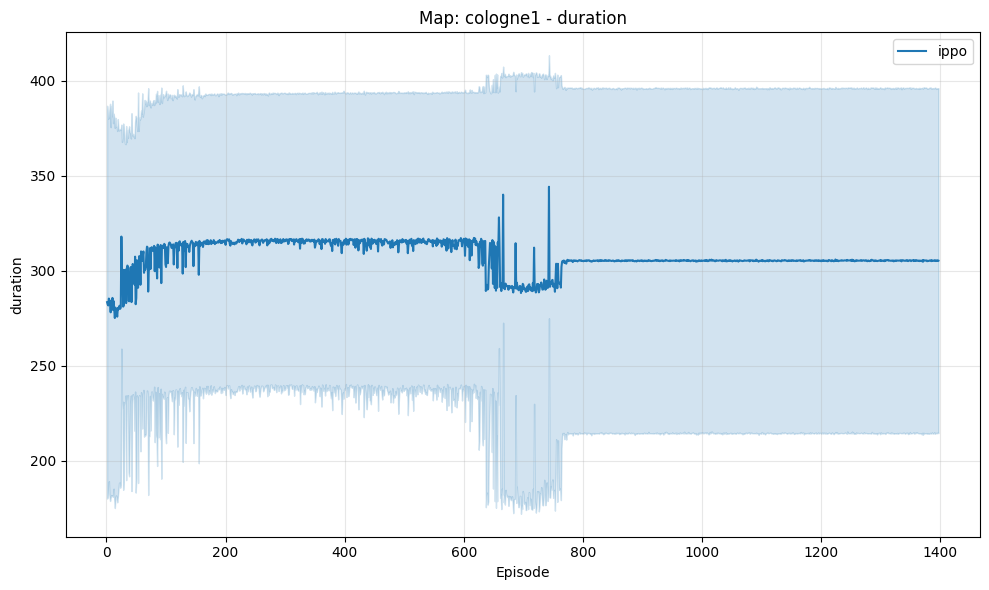

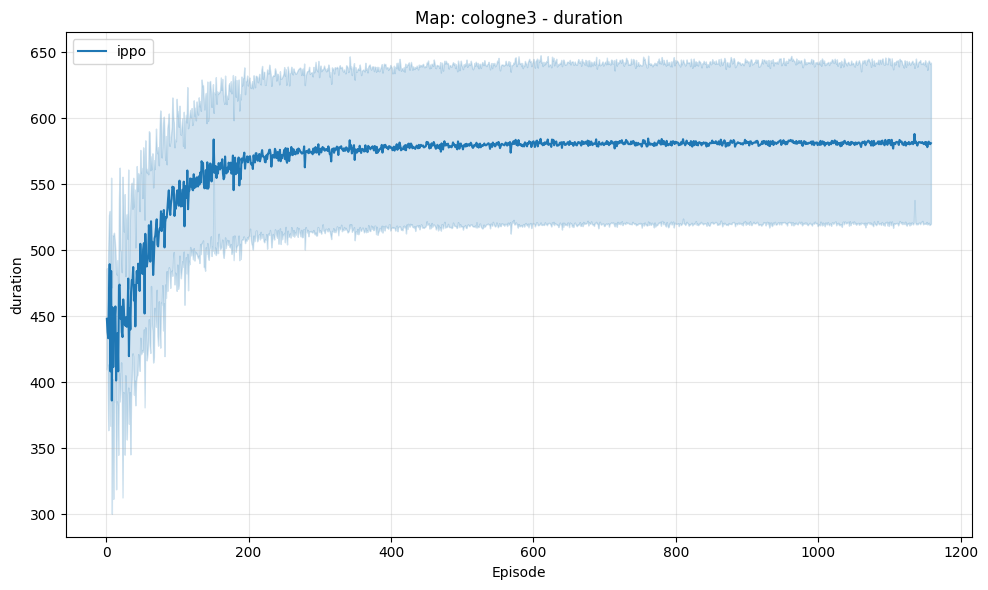

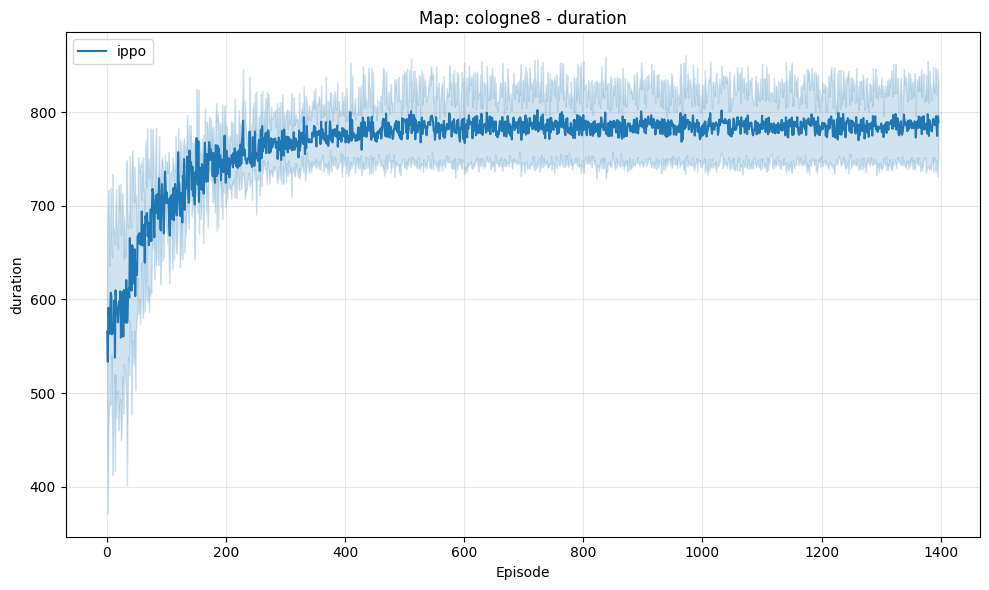

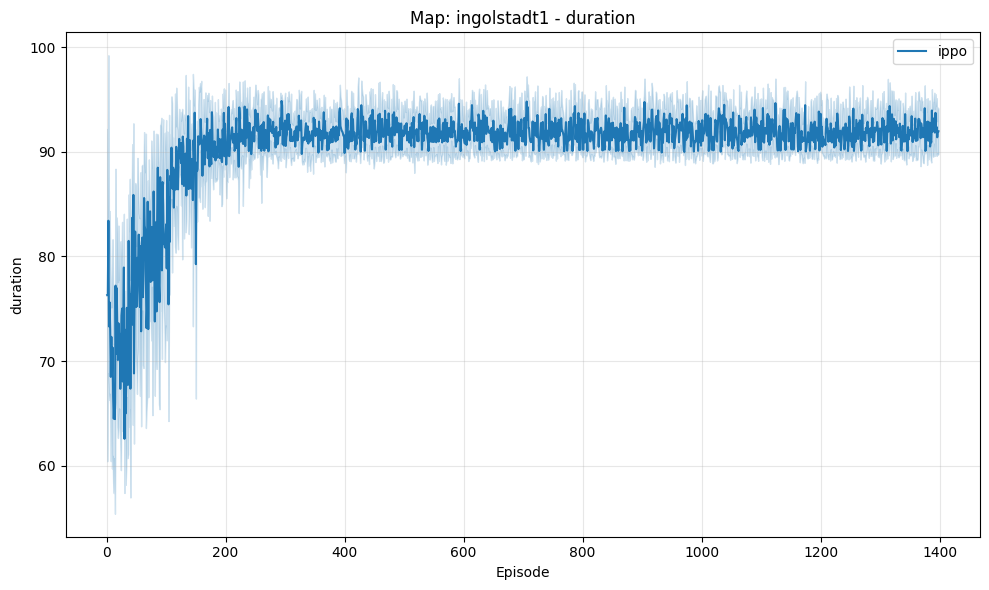

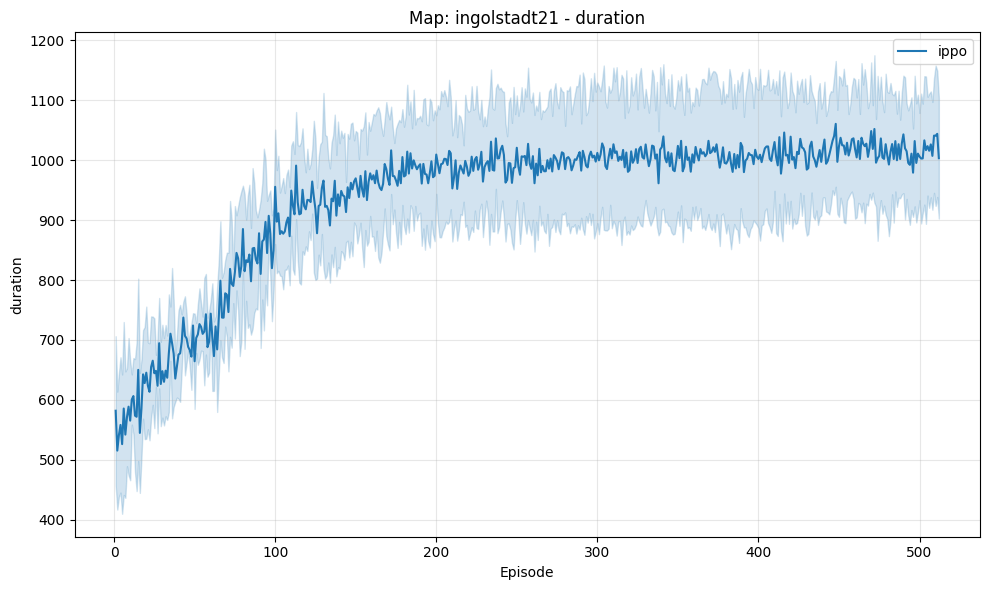

...

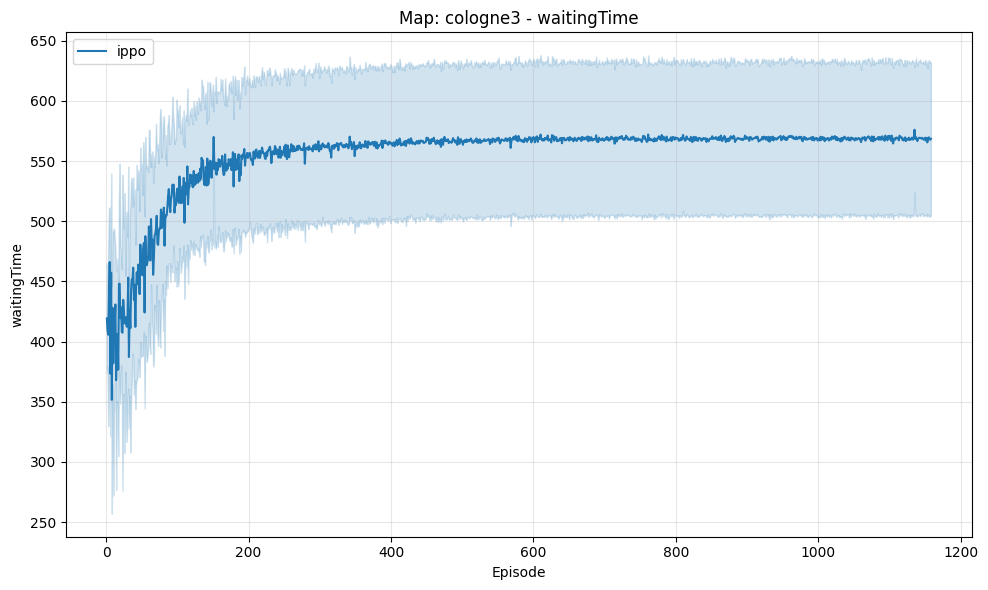

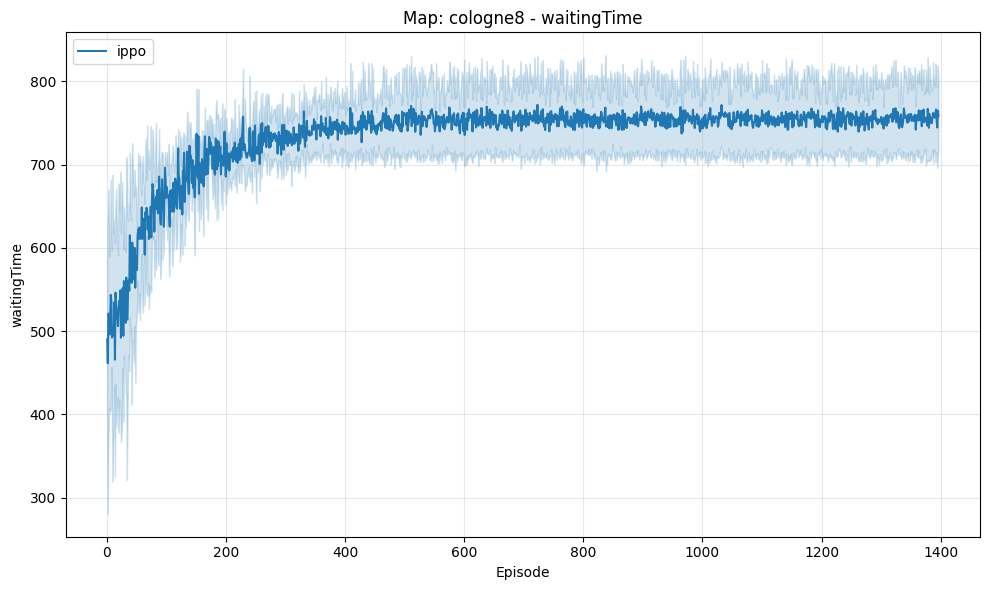

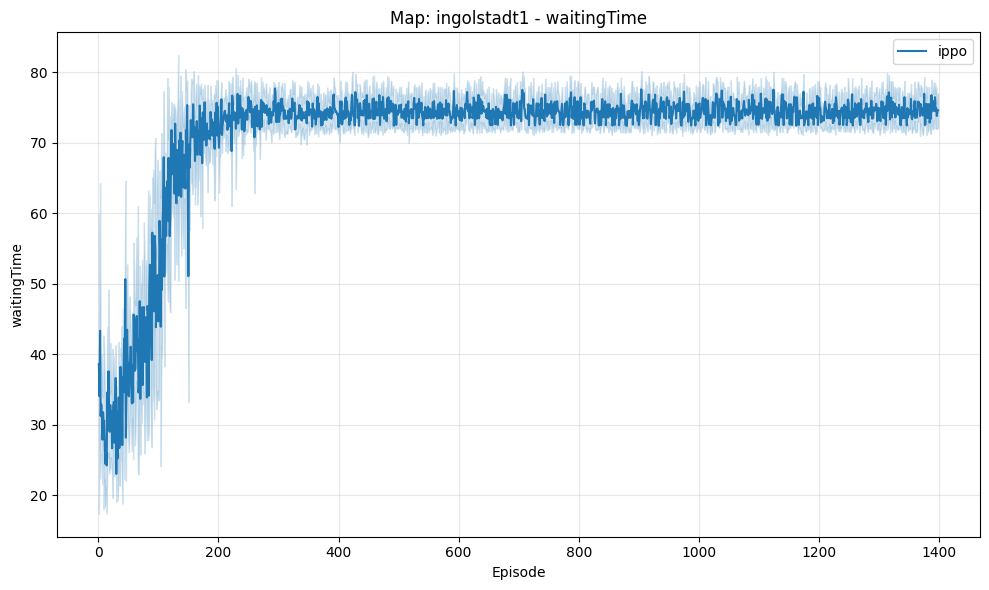

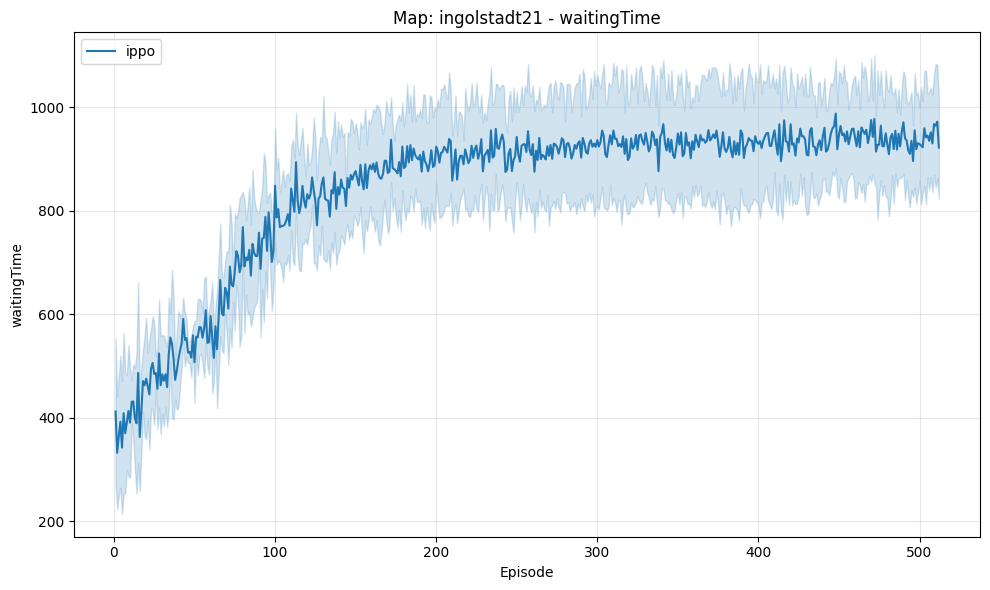

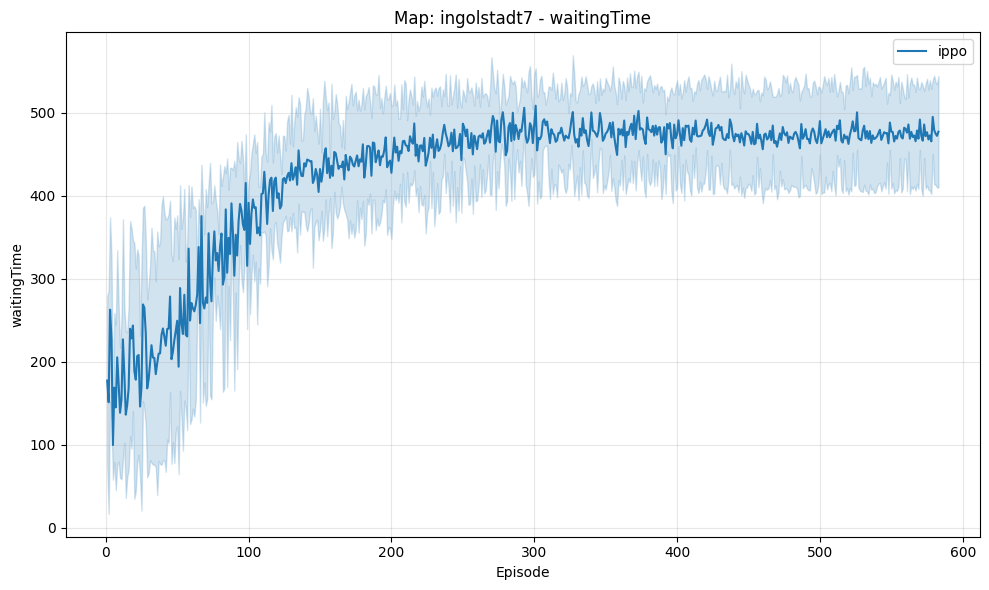

In [12]:
%matplotlib inline
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import glob
from collections import defaultdict

# === 1. 配置你的结果路径 ===
possible_paths = [
    "results", 
    "../results", 
    os.path.expanduser("~/PHD_PROJECTS/RESCO/results")
]
LOG_DIR = None
for p in possible_paths:
    if os.path.exists(p) and os.path.isdir(p):
        LOG_DIR = p
        break

if not LOG_DIR:
    print("❌ 找不到 results 文件夹，请手动修改 LOG_DIR 变量。")
else:
    print(f"✅ 数据目录: {LOG_DIR}")

# === 2. 数据加载函数 ===
def load_and_group_data(log_dir):
    # 结构: data[地图名][算法名][指标名] = [ [seed1数据], [seed2数据], ... ]
    grouped_data = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))
    # 用来记录我们发现了哪些指标
    found_metrics = set()
    
    json_files = glob.glob(os.path.join(log_dir, "*.json"))
    print(f"找到 {len(json_files)} 个 JSON 文件。")

    for filepath in json_files:
        filename = os.path.basename(filepath)
        if "config.json" in filename: continue
        
        # 解析文件名: map+alg_hash.json
        try:
            if '+' in filename:
                parts = filename.split('+')
                map_name = parts[0]
                rest = parts[1]
                alg_name = rest.split('_')[0].replace('.json', '')
            else:
                map_name = "Unknown"
                alg_name = filename.split('_')[0]
        except:
            continue

        try:
            with open(filepath, 'r') as f:
                content = json.load(f)
                
            # 遍历文件里的所有指标
            for metric, runs in content.items():
                # 记录这个指标 (比如 rewards, timeLoss)
                found_metrics.add(metric)
                
                for run_hash, values in runs.items():
                    if len(values) > 0:
                        grouped_data[map_name][alg_name][metric].append(values)
        except Exception as e:
            print(f"读取 {filename} 失败: {e}")
            
    return grouped_data, list(sorted(found_metrics))

# === 3. 画图函数 ===
def plot_results(data, target_metric):
    maps = sorted(data.keys())
    if not maps: return

    print(f"\n📊 正在绘制: {target_metric}")
    
    # 为每个地图画一张图
    for map_name in maps:
        algorithms = data[map_name]
        
        # 检查这个地图下有没有关于该指标的数据
        has_data_for_map = False
        for alg in algorithms:
            if target_metric in algorithms[alg] and algorithms[alg][target_metric]:
                has_data_for_map = True
                break
        
        if not has_data_for_map:
            continue

        plt.figure(figsize=(10, 6))
        plt.title(f"Map: {map_name} - {target_metric}")
        
        has_plot = False
        for alg_name, metrics in algorithms.items():
            if target_metric not in metrics: continue
            seeds_data = metrics[target_metric]
            if not seeds_data: continue
            
            # 对齐数据
            min_len = min(len(s) for s in seeds_data)
            truncated_data = [s[:min_len] for s in seeds_data]
            arr = np.array(truncated_data)
            
            # 计算
            mean = np.mean(arr, axis=0)
            std = np.std(arr, axis=0)
            x = range(1, len(mean) + 1)
            
            # 画图
            line, = plt.plot(x, mean, label=alg_name)
            plt.fill_between(x, mean - std, mean + std, alpha=0.2, color=line.get_color())
            has_plot = True

        if has_plot:
            plt.xlabel("Episode")
            plt.ylabel(target_metric)
            plt.legend()
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()
            plt.close()

# === 4. 执行 ===
if LOG_DIR:
    # 加载数据
    full_data, all_metrics = load_and_group_data(LOG_DIR)
    
    print(f"🔍 发现的所有指标: {all_metrics}")
    
    # 自动遍历所有指标画图
    if not all_metrics:
        print("没有发现任何指标数据。请确认实验是否跑完了第1个episode。")
    else:
        for metric in all_metrics:
            plot_results(full_data, metric)

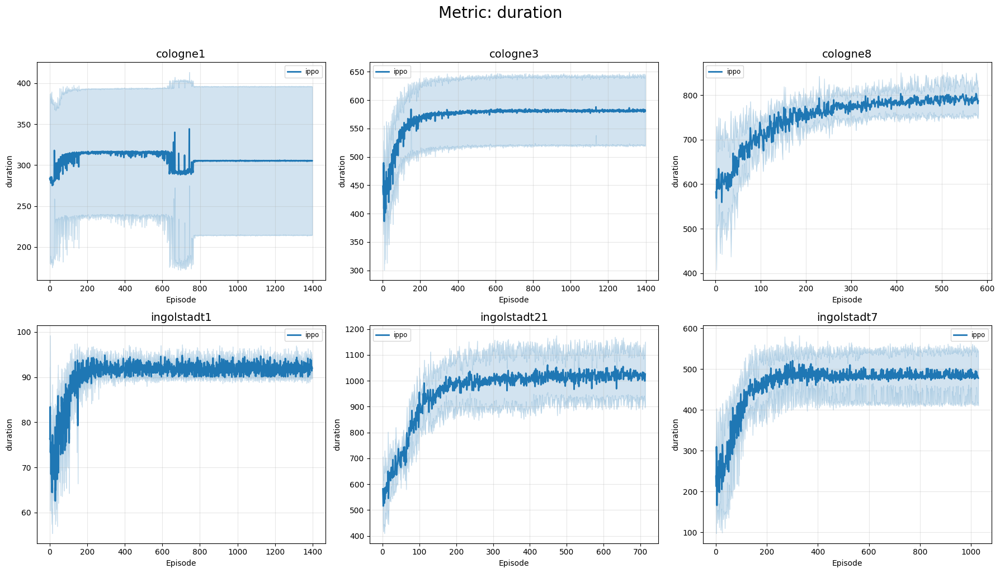

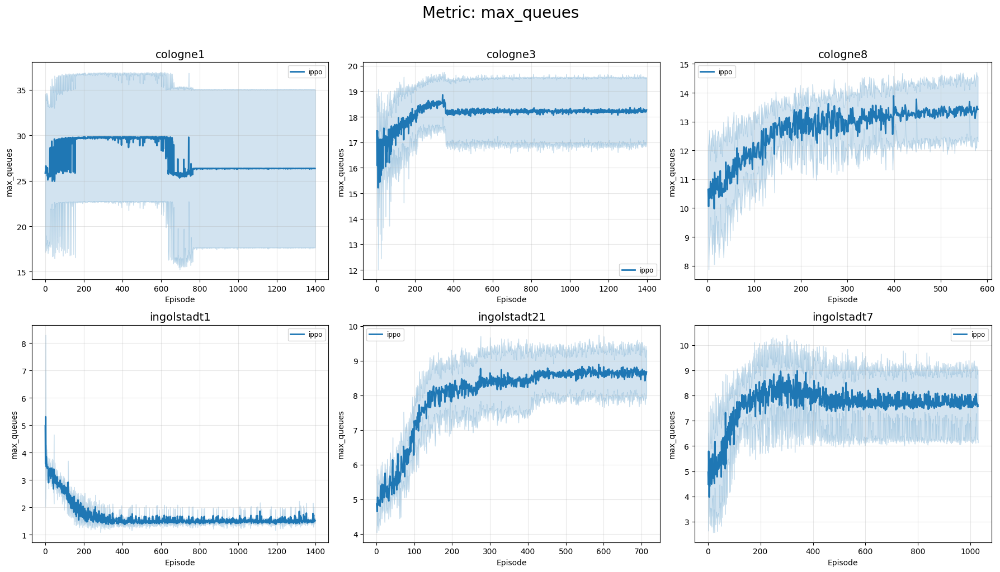

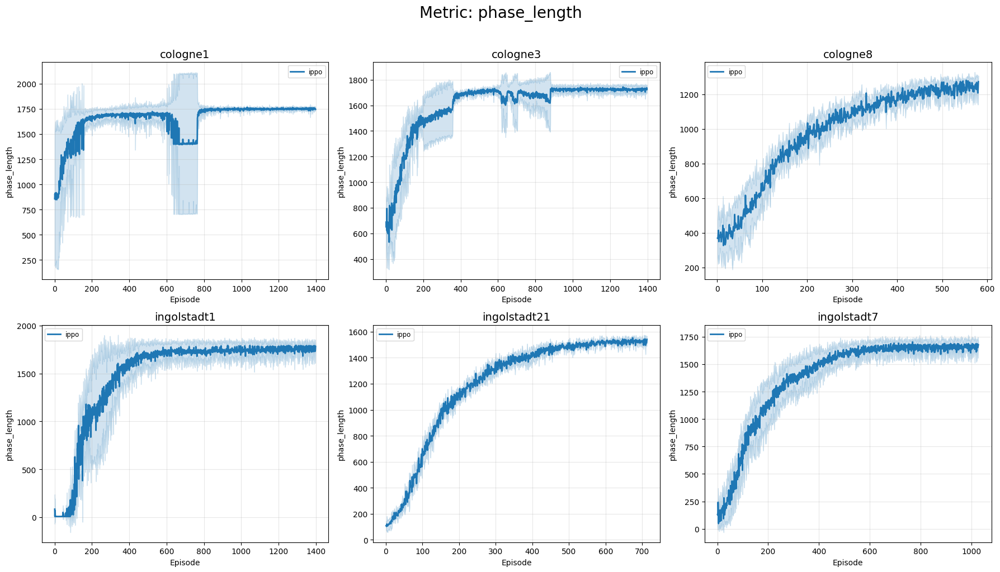

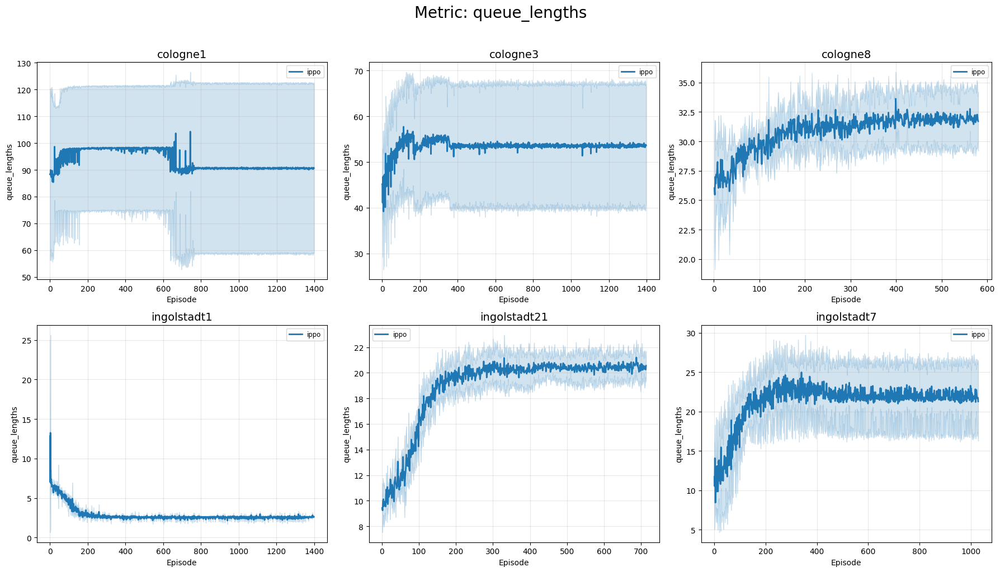

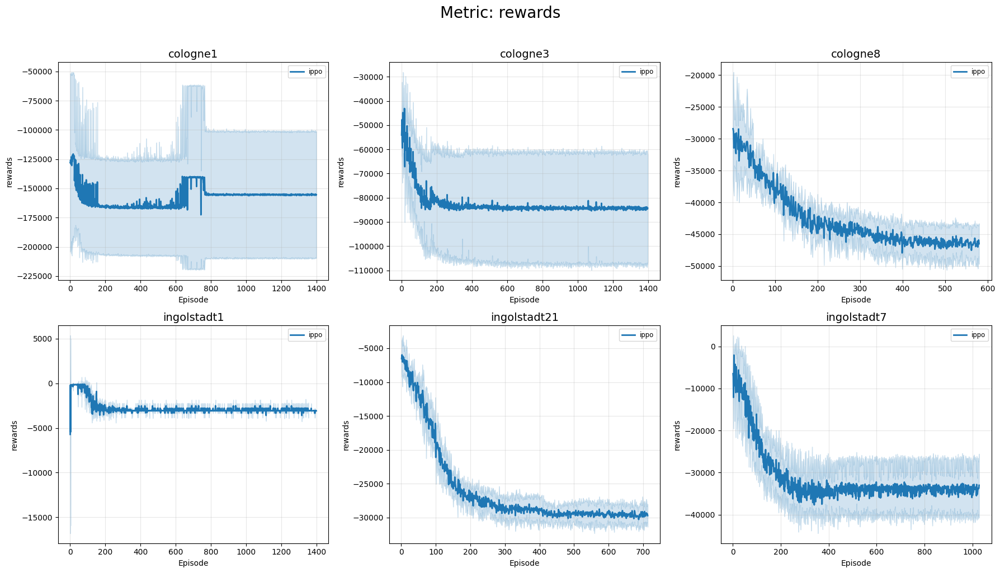

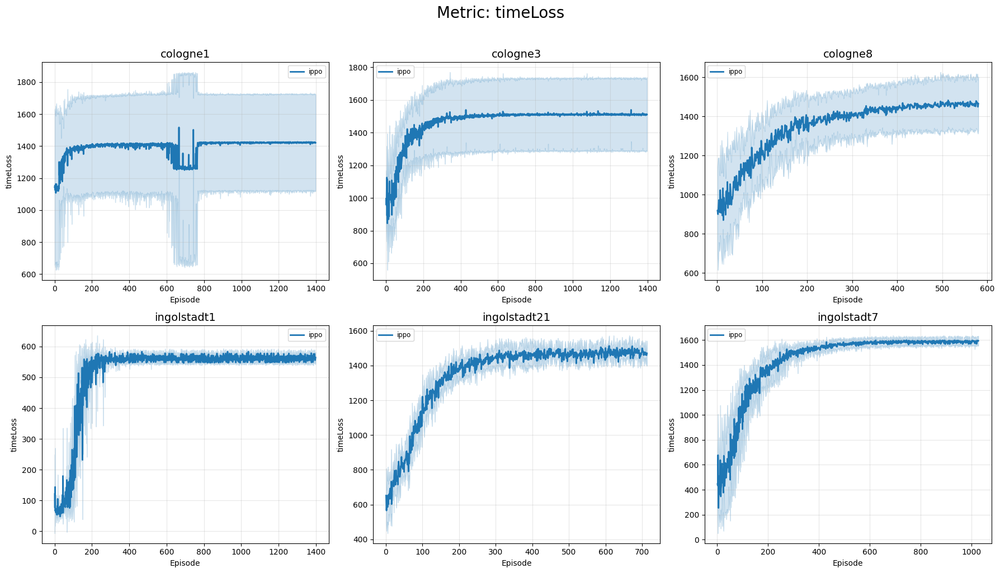

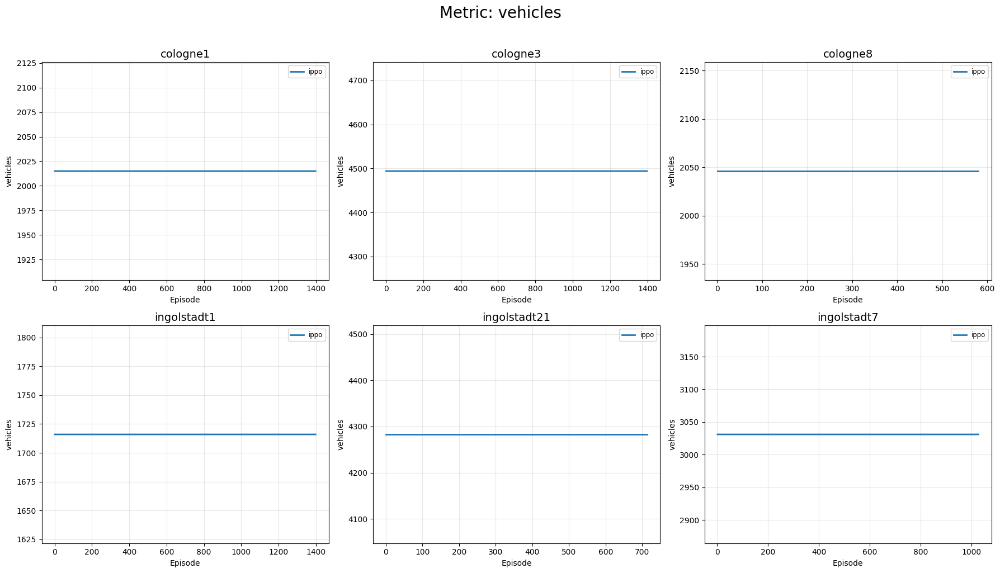

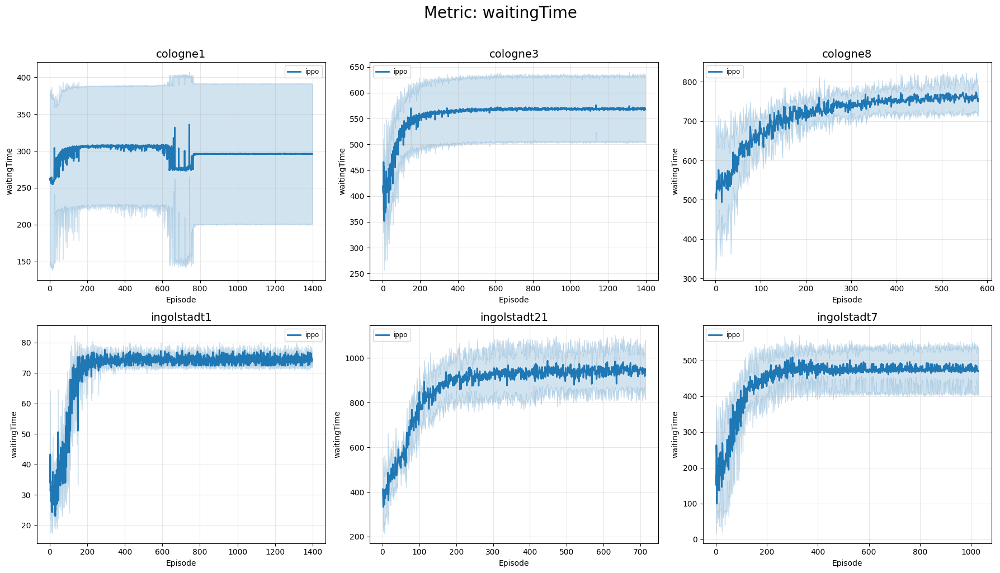

In [14]:
%matplotlib inline
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import glob
import math
from collections import defaultdict

# === 1. 配置路径 ===
possible_paths = [
    "results", 
    "../results", 
    os.path.expanduser("~/PHD_PROJECTS/RESCO/results")
]
LOG_DIR = None
for p in possible_paths:
    if os.path.exists(p) and os.path.isdir(p):
        LOG_DIR = p
        break

if not LOG_DIR:
    print("❌ 找不到 results 文件夹")
else:
    print(f"✅ 数据目录: {LOG_DIR}")

# === 2. 数据加载函数 (保持不变) ===
def load_and_group_data(log_dir):
    grouped_data = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))
    found_metrics = set()
    
    json_files = glob.glob(os.path.join(log_dir, "*.json"))
    print(f"正在处理 {len(json_files)} 个文件...")

    for filepath in json_files:
        filename = os.path.basename(filepath)
        if "config.json" in filename: continue
        
        try:
            if '+' in filename:
                parts = filename.split('+')
                map_name = parts[0]
                rest = parts[1]
                alg_name = rest.split('_')[0].replace('.json', '')
            else:
                map_name = "Unknown"
                alg_name = filename.split('_')[0]
        except:
            continue

        try:
            with open(filepath, 'r') as f:
                content = json.load(f)
            for metric, runs in content.items():
                found_metrics.add(metric)
                for run_hash, values in runs.items():
                    if len(values) > 0:
                        grouped_data[map_name][alg_name][metric].append(values)
        except:
            pass
            
    return grouped_data, list(sorted(found_metrics))

# === 3. 子图绘制核心函数 ===
def plot_metric_subplots(data, metric):
    # 找出包含这个指标的所有地图
    maps_with_data = []
    for map_name in data:
        # 检查该地图下是否有算法包含此指标数据
        has_metric = False
        for alg in data[map_name]:
            if metric in data[map_name][alg] and data[map_name][alg][metric]:
                has_metric = True
                break
        if has_metric:
            maps_with_data.append(map_name)
            
    maps_with_data.sort()
    n_maps = len(maps_with_data)
    
    if n_maps == 0:
        return

    # 计算子图布局 (例如 3列 x N行)
    n_cols = 3
    n_rows = math.ceil(n_maps / n_cols)
    
    # 创建大图
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    fig.suptitle(f"Metric: {metric}", fontsize=20, y=1.02) # 大标题
    
    # 扁平化 axes 数组方便遍历 (处理只有1行或1列的特殊情况)
    if n_maps == 1: axes = [axes]
    else: axes = axes.flatten()
    
    # 遍历每个地图画图
    for i, map_name in enumerate(maps_with_data):
        ax = axes[i]
        ax.set_title(map_name, fontsize=14)
        
        algorithms = data[map_name]
        
        for alg_name, metrics in algorithms.items():
            if metric not in metrics: continue
            seeds_data = metrics[metric]
            if not seeds_data: continue
            
            # 对齐与计算
            min_len = min(len(s) for s in seeds_data)
            truncated_data = [s[:min_len] for s in seeds_data]
            arr = np.array(truncated_data)
            
            mean = np.mean(arr, axis=0)
            std = np.std(arr, axis=0)
            x = range(1, len(mean) + 1)
            
            # 绘图
            line, = ax.plot(x, mean, label=alg_name, linewidth=2)
            ax.fill_between(x, mean - std, mean + std, alpha=0.2, color=line.get_color())
        
        ax.set_xlabel("Episode")
        ax.set_ylabel(metric)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best', fontsize='small')

    # 隐藏多余的空子图
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
        
    plt.tight_layout()
    plt.show()

# === 4. 执行 ===
if LOG_DIR:
    full_data, all_metrics = load_and_group_data(LOG_DIR)
    
    print(f"发现指标: {all_metrics}")
    
    # 为每个指标生成一张包含所有地图的大图
    for metric in all_metrics:
        print(f"正在绘制 {metric} ...")
        plot_metric_subplots(full_data, metric)

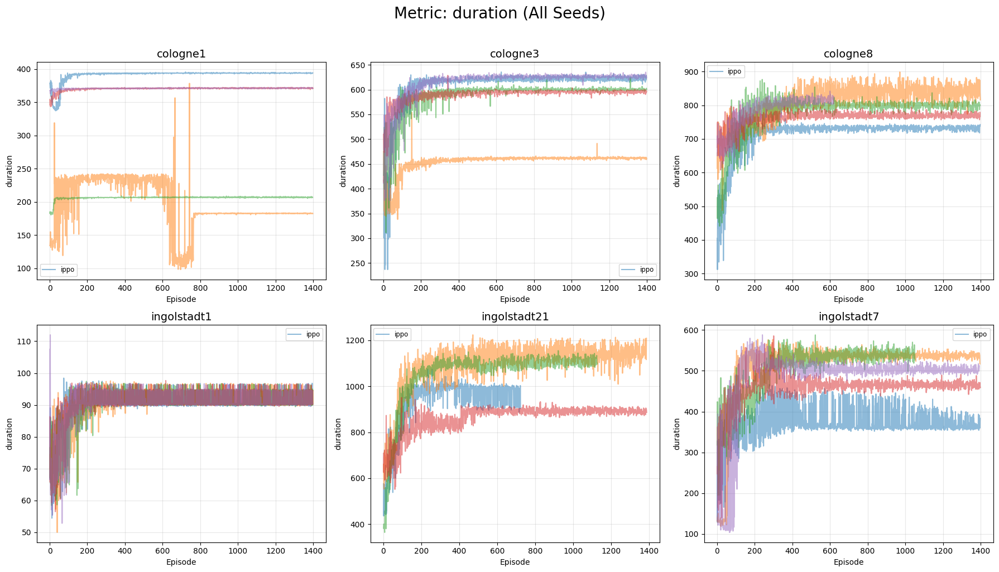

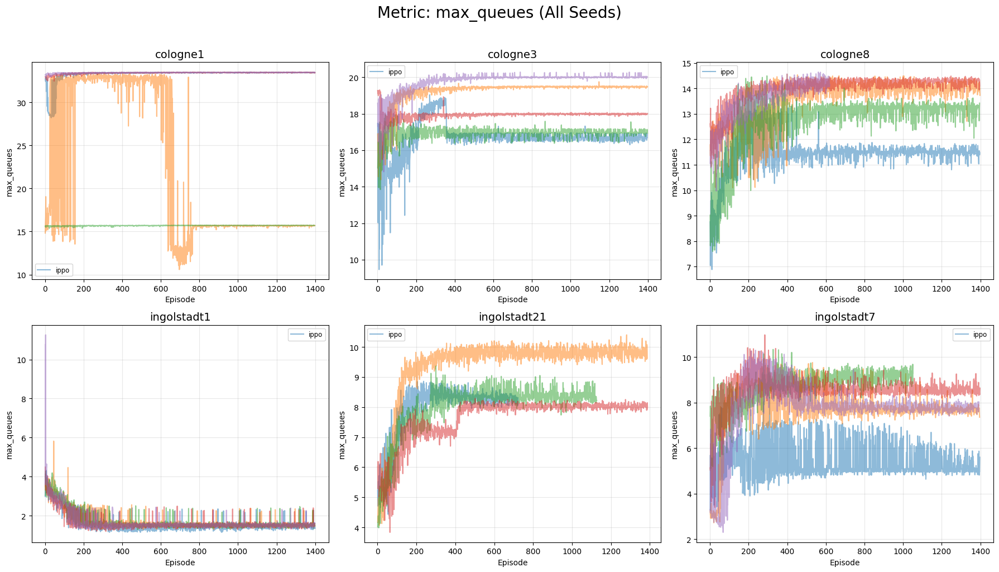

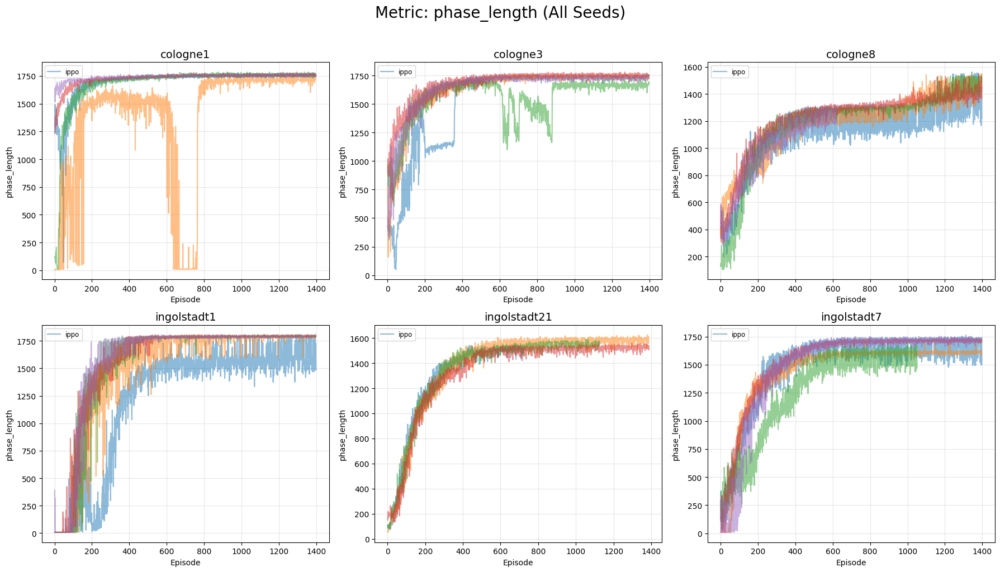

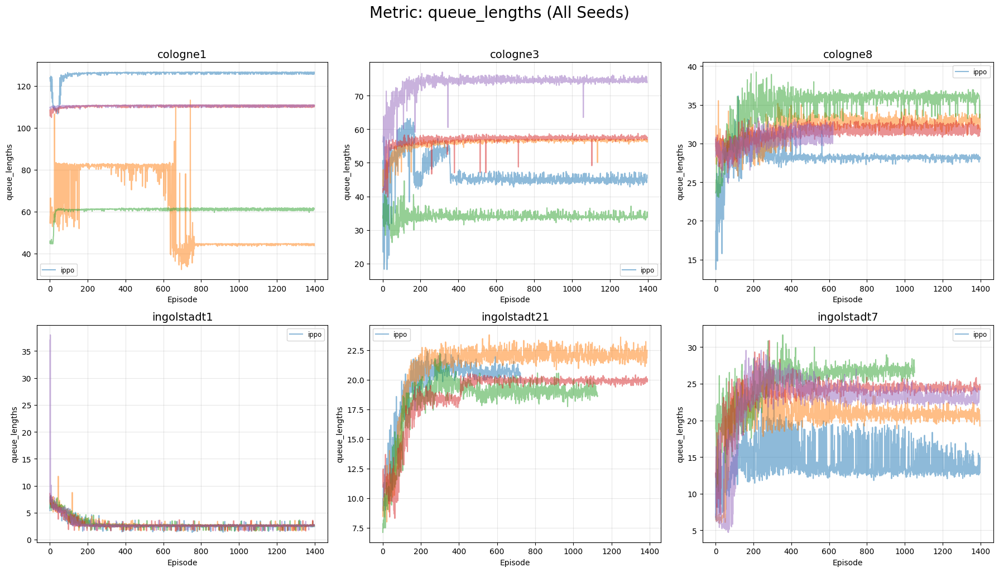

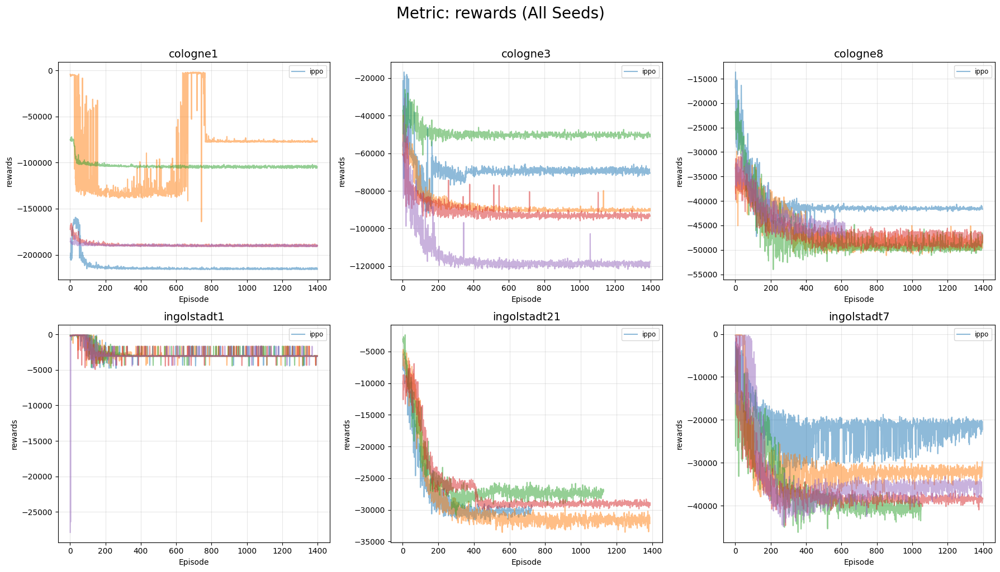

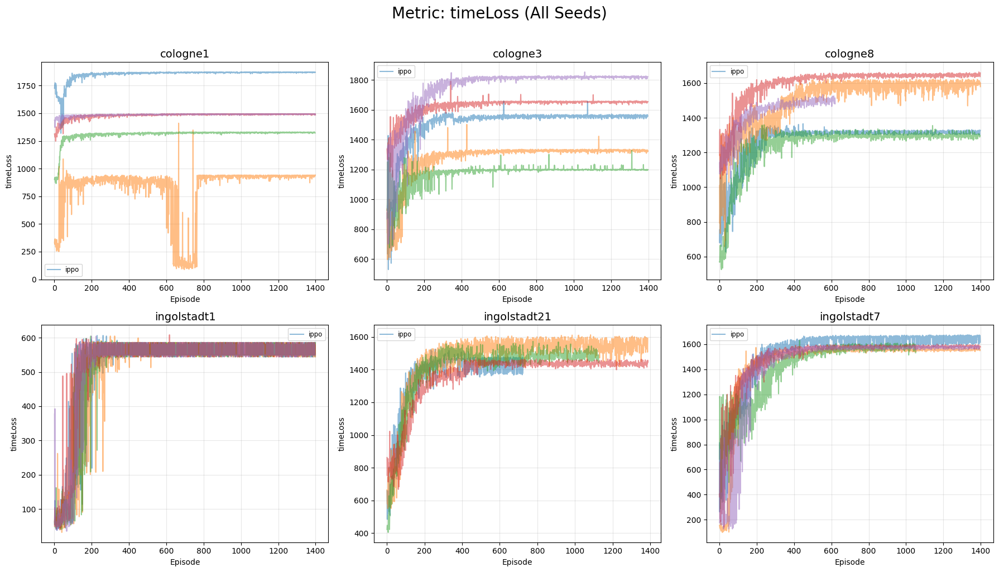

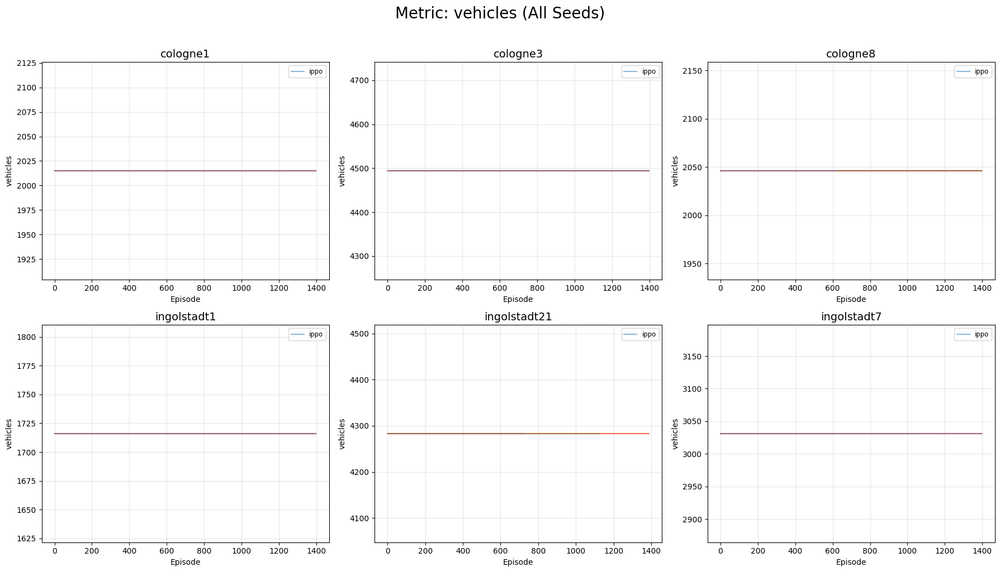

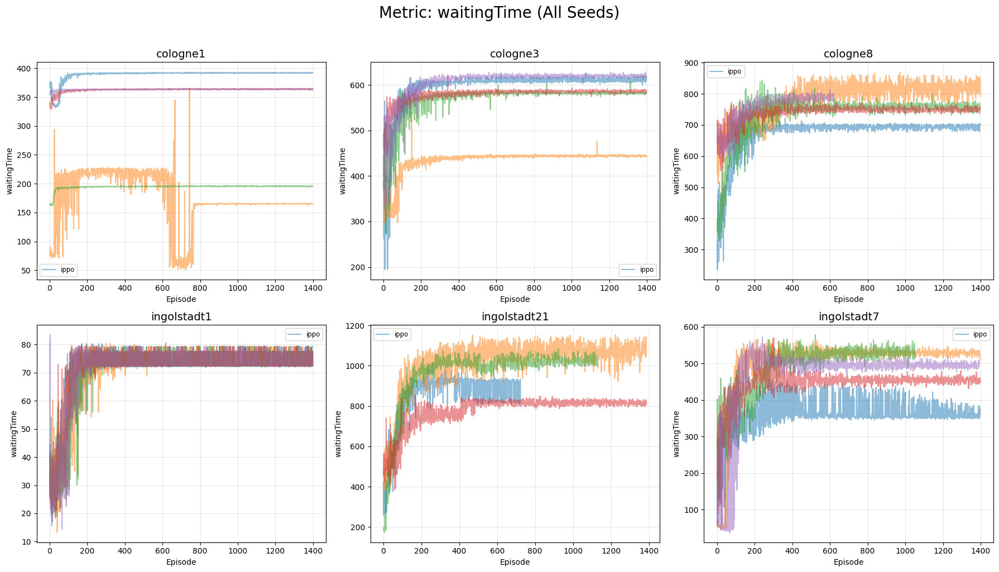

In [16]:
%matplotlib inline
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import glob
import math
from collections import defaultdict

# === 1. 配置路径 ===
possible_paths = [
    "results", 
    "../results", 
    os.path.expanduser("~/PHD_PROJECTS/RESCO/results")
]
LOG_DIR = None
for p in possible_paths:
    if os.path.exists(p) and os.path.isdir(p):
        LOG_DIR = p
        break

if not LOG_DIR:
    print("❌ 找不到 results 文件夹")
else:
    print(f"✅ 数据目录: {LOG_DIR}")

# === 2. 数据加载函数 ===
def load_and_group_data(log_dir):
    # 结构: data[地图名][算法名][指标名] = [ [seed1数据], [seed2数据], ... ]
    grouped_data = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))
    found_metrics = set()
    
    # 获取所有json文件
    json_files = glob.glob(os.path.join(log_dir, "*.json"))
    print(f"正在解析 {len(json_files)} 个结果文件...")
    
    for filepath in json_files:
        filename = os.path.basename(filepath)
        if "config.json" in filename: continue
        
        try:
            if '+' in filename:
                parts = filename.split('+')
                map_name = parts[0]
                # 解析算法名，去掉 _hash.json
                rest = parts[1]
                alg_name = rest.split('_')[0].replace('.json', '')
            else:
                map_name = "Unknown"
                alg_name = filename.split('_')[0]
        except:
            continue

        try:
            with open(filepath, 'r') as f:
                content = json.load(f)
            
            # 自动发现所有指标
            for metric, runs in content.items():
                found_metrics.add(metric)
                for run_hash, values in runs.items():
                    if len(values) > 0:
                        grouped_data[map_name][alg_name][metric].append(values)
        except:
            pass
            
    return grouped_data, list(sorted(found_metrics))

# === 3. 画所有 Seed 的核心函数 ===
def plot_all_seeds(data, metric):
    # 找出包含这个指标的所有地图
    maps_with_data = []
    for map_name in data:
        has_metric = False
        for alg in data[map_name]:
            if metric in data[map_name][alg] and data[map_name][alg][metric]:
                has_metric = True
                break
        if has_metric:
            maps_with_data.append(map_name)
            
    maps_with_data.sort()
    n_maps = len(maps_with_data)
    
    if n_maps == 0:
        return

    # 计算布局 (3列 x N行)
    n_cols = 3
    n_rows = math.ceil(n_maps / n_cols)
    
    # 设置大图尺寸
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    fig.suptitle(f"Metric: {metric} (All Seeds)", fontsize=20, y=1.02)
    
    # 处理只有一个子图的情况
    if n_maps == 1: axes = [axes]
    elif isinstance(axes, np.ndarray): axes = axes.flatten()
    
    # 遍历每个地图
    for i, map_name in enumerate(maps_with_data):
        ax = axes[i]
        ax.set_title(map_name, fontsize=14)
        
        algorithms = data[map_name]
        
        for alg_name, metrics in algorithms.items():
            if metric not in metrics: continue
            seeds_data = metrics[metric]
            if not seeds_data: continue
            
            # === 画每一条线 (每个 Seed) ===
            for seed_idx, seed_values in enumerate(seeds_data):
                x = range(1, len(seed_values) + 1)
                
                # 使用半透明线条 (alpha=0.5)，这样重叠的线会变深
                # 为每个算法保持一种色系，但每条线独立
                ax.plot(x, seed_values, 
                        label=f"{alg_name}" if seed_idx == 0 else "", # 只给第一条线加图例标签，防止图例爆炸 
                        alpha=0.5, linewidth=1.5)
        
        ax.set_xlabel("Episode")
        ax.set_ylabel(metric)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best', fontsize='small')

    # 隐藏多余的空白子图
    if isinstance(axes, (list, np.ndarray)):
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)
        
    plt.tight_layout()
    plt.show()

# === 4. 执行 ===
if LOG_DIR:
    full_data, all_metrics = load_and_group_data(LOG_DIR)
    
    print(f"🔍 发现指标: {all_metrics}")
    
    if not all_metrics:
        print("没有发现任何指标数据。")
    else:
        # 自动遍历所有指标
        for metric in all_metrics:
            print(f"\n正在绘制 {metric} ...")
            plot_all_seeds(full_data, metric)
            print("-" * 50)

✅ 正在读取 IDQN 的数据...
发现地图: ['cologne1', 'cologne3', 'cologne8', 'ingolstadt1', 'ingolstadt21', 'ingolstadt7']

📊 === timeLoss (IDQN) ===


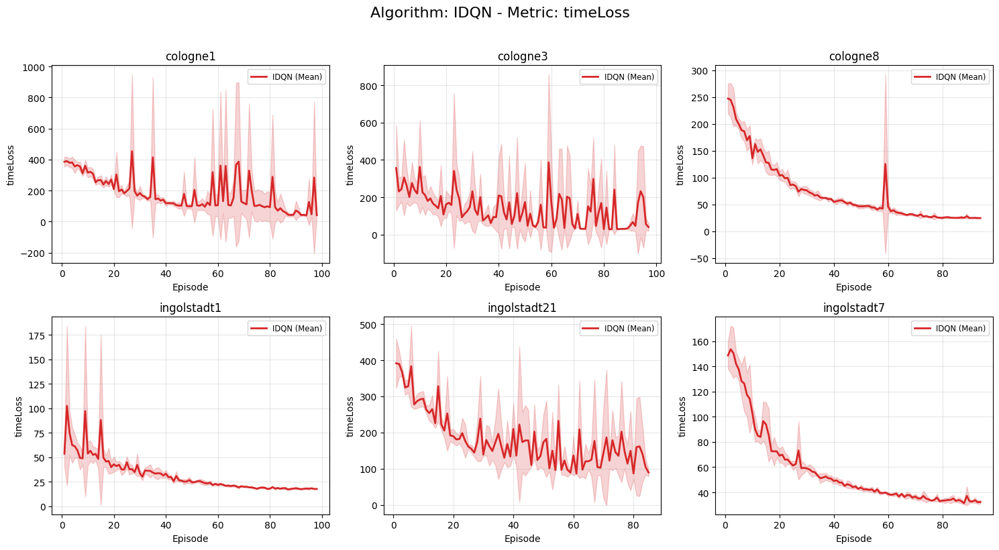


📊 === rewards (IDQN) ===


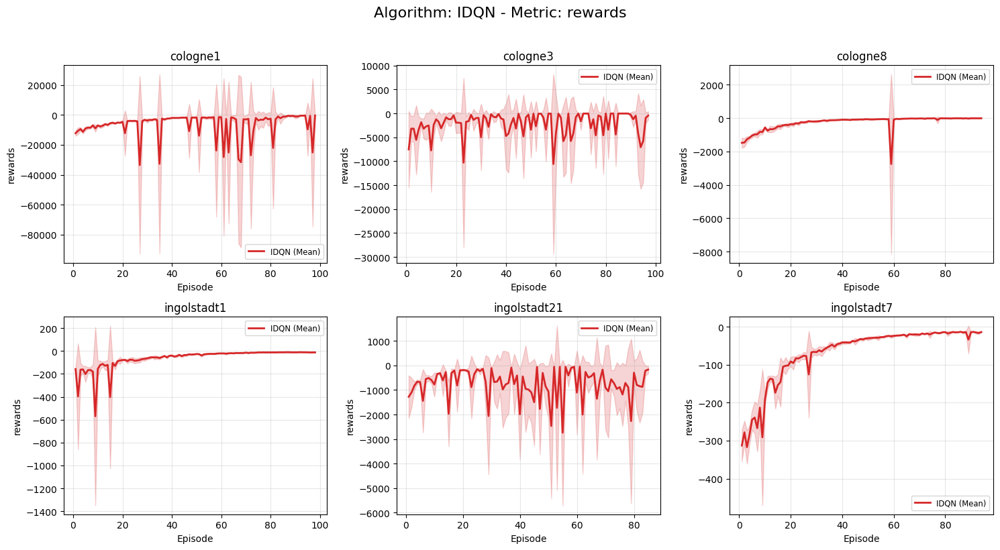


📊 === queue_lengths (IDQN) ===


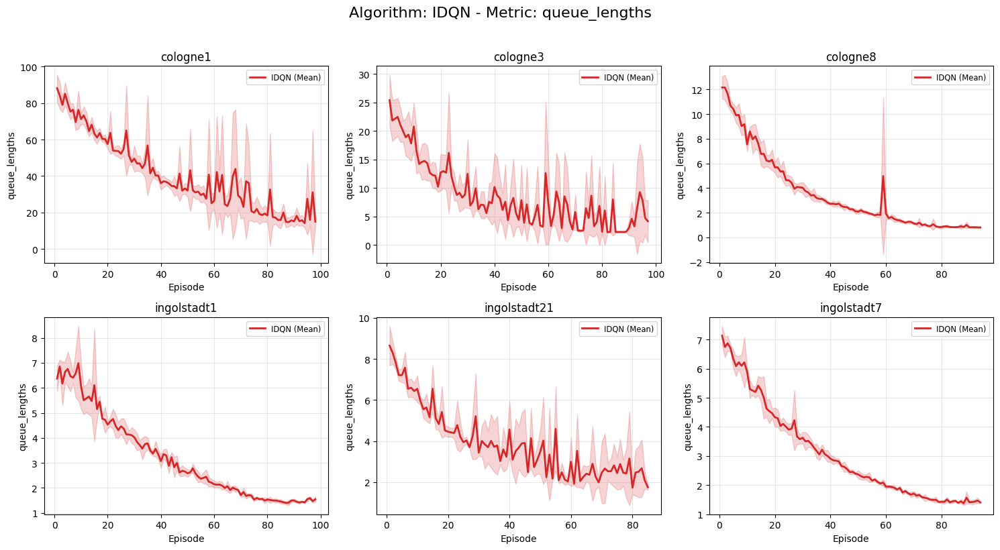

In [1]:
%matplotlib inline
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import glob
from collections import defaultdict

# ==============================
# 👇👇👇 只需要修改这里 👇👇👇
# ==============================

# 你想看哪个算法？ (不区分大小写)
# 选项: "IDQN", "IPPO", "MPLight", "FMA2C" ...
TARGET_ALG = "IDQN" 

# 你想看哪些指标？
# 选项: "timeLoss", "queue_lengths", "rewards", "duration", "waitingTime"
TARGET_METRICS = ["timeLoss", "rewards", "queue_lengths"]

# 结果文件夹路径
LOG_DIR = "results" 

# ==============================
# 👆👆👆 修改结束 👆👆👆
# ==============================

def plot_simple_algorithm_view():
    # 1. 寻找路径
    real_log_dir = None
    search_paths = [LOG_DIR, "../" + LOG_DIR, os.path.expanduser("~/PHD_PROJECTS/RESCO/" + LOG_DIR)]
    for p in search_paths:
        if os.path.exists(p) and os.path.isdir(p):
            real_log_dir = p
            break
    
    if not real_log_dir:
        print(f"❌ 找不到 {LOG_DIR} 文件夹。")
        return

    print(f"✅ 正在读取 {TARGET_ALG} 的数据...")
    
    # 2. 加载并过滤数据
    # 结构: data[地图名][指标名] = [ [seed1数据], [seed2数据]... ]
    data = defaultdict(lambda: defaultdict(list))
    json_files = glob.glob(os.path.join(real_log_dir, "*.json"))
    
    file_count = 0
    for filepath in json_files:
        filename = os.path.basename(filepath)
        if "config.json" in filename: continue
        
        # 简单的文件名检查：文件名里必须包含 TARGET_ALG
        if TARGET_ALG.lower() not in filename.lower():
            continue
            
        try:
            # 解析地图名 (假设文件名格式: map+alg_hash.json)
            if '+' in filename:
                map_name = filename.split('+')[0]
            else:
                map_name = "Unknown"

            with open(filepath, 'r') as f:
                content = json.load(f)
                
            for metric in TARGET_METRICS:
                if metric in content:
                    for run_hash, values in content[metric].items():
                        if len(values) > 0:
                            data[map_name][metric].append(values)
                            file_count += 1
        except Exception as e:
            continue

    if file_count == 0:
        print(f"⚠️ 没有找到关于 {TARGET_ALG} 的数据。请检查拼写或确认实验是否已跑完第1个episode。")
        return

    # 3. 画图
    maps = sorted(data.keys())
    print(f"发现地图: {maps}")

    for metric in TARGET_METRICS:
        print(f"\n📊 === {metric} ({TARGET_ALG}) ===")
        
        # 自动计算子图布局
        n_maps = len(maps)
        if n_maps == 0: continue
        n_cols = 3
        n_rows = (n_maps + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
        if n_maps == 1: axes = [axes]
        else: axes = axes.flatten()
        
        fig.suptitle(f"Algorithm: {TARGET_ALG} - Metric: {metric}", fontsize=16, y=1.02)

        for i, map_name in enumerate(maps):
            ax = axes[i]
            ax.set_title(map_name)
            
            seeds_data = data[map_name][metric]
            if not seeds_data:
                ax.text(0.5, 0.5, "No Data", ha='center', va='center')
                continue
            
            # 对齐数据长度
            min_len = min(len(s) for s in seeds_data)
            truncated = [s[:min_len] for s in seeds_data]
            arr = np.array(truncated)
            
            # 计算均值和方差
            mean = np.mean(arr, axis=0)
            std = np.std(arr, axis=0)
            x = range(1, len(mean) + 1)
            
            # 画主线 (平均值)
            color = 'tab:blue' if TARGET_ALG.lower() == 'ippo' else 'tab:red'
            ax.plot(x, mean, label=f"{TARGET_ALG} (Mean)", color=color, linewidth=2)
            
            # 画阴影 (标准差)
            ax.fill_between(x, mean - std, mean + std, alpha=0.2, color=color)
            
            # (可选) 如果想看每一条线，把下面这两行取消注释
            # for s in truncated:
            #     ax.plot(range(1, len(s)+1), s, color=color, alpha=0.3, linewidth=0.5)

            ax.set_xlabel("Episode")
            ax.set_ylabel(metric)
            ax.grid(True, alpha=0.3)
            ax.legend(fontsize='small')

        # 隐藏多余子图
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)
            
        plt.tight_layout()
        plt.show()

# 运行
plot_simple_algorithm_view()

✅ 正在读取 ['IDQN', 'IPPO'] 的数据...

📊 === 对比指标: timeLoss ===


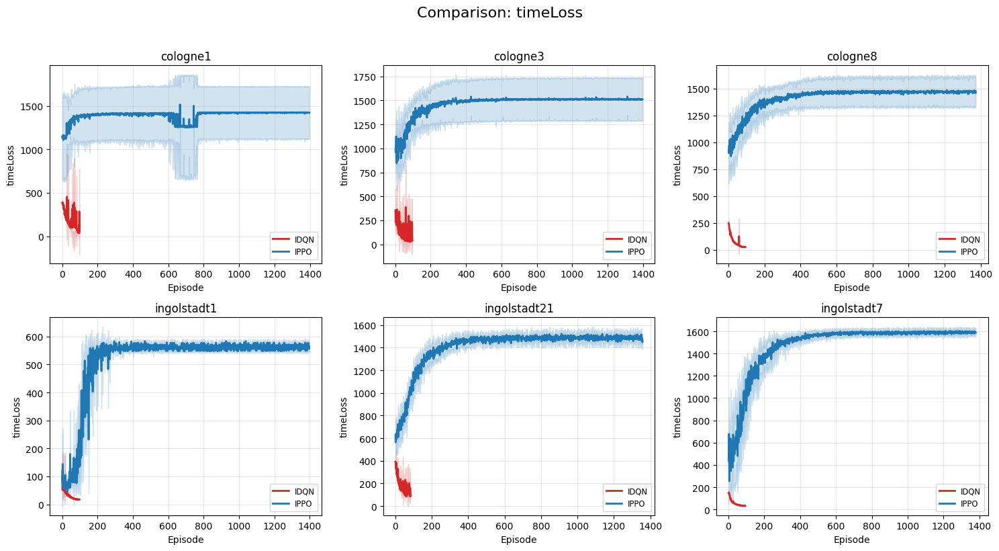


📊 === 对比指标: rewards ===


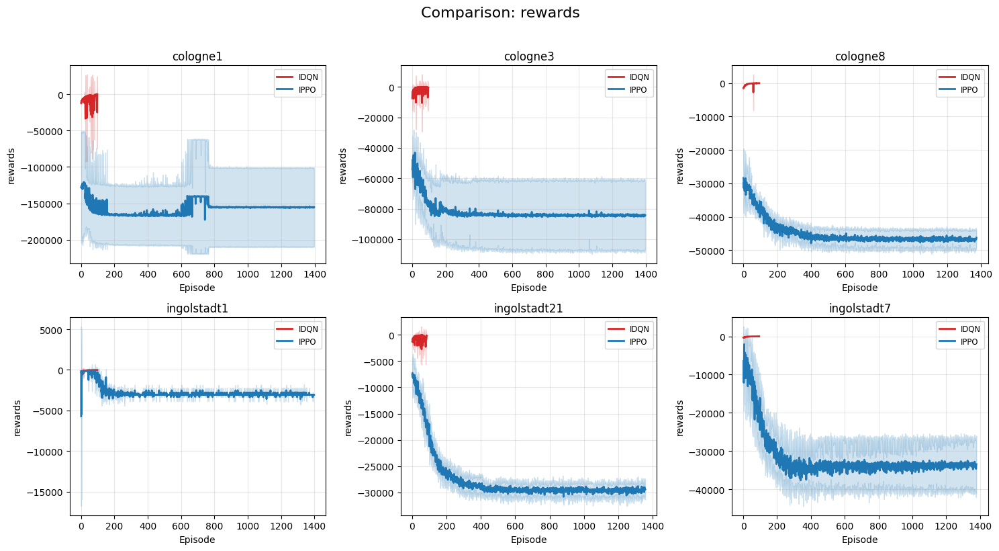


📊 === 对比指标: queue_lengths ===


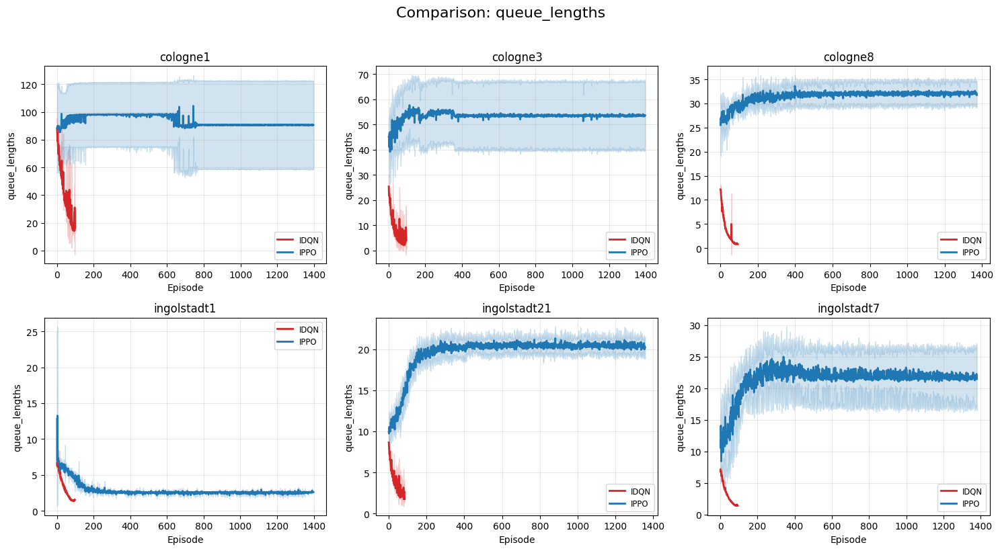

In [2]:
%matplotlib inline
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import glob
from collections import defaultdict

# ==============================
# 👇👇👇 修改这里来进行对比 👇👇👇
# ==============================

# 把你想对比的算法都写在这里
TARGET_ALGS = ["IDQN", "IPPO"] 

# 你想看的指标
TARGET_METRICS = ["timeLoss", "rewards", "queue_lengths"]

# 结果文件夹
LOG_DIR = "results"

# ==============================

def plot_comparison():
    # 1. 寻找路径
    real_log_dir = None
    search_paths = [LOG_DIR, "../" + LOG_DIR, os.path.expanduser("~/PHD_PROJECTS/RESCO/" + LOG_DIR)]
    for p in search_paths:
        if os.path.exists(p) and os.path.isdir(p):
            real_log_dir = p
            break
    
    if not real_log_dir:
        print(f"❌ 找不到 {LOG_DIR} 文件夹。")
        return

    print(f"✅ 正在读取 {TARGET_ALGS} 的数据...")
    
    # 2. 加载数据
    # 结构: data[地图名][算法名][指标名] = [数据...]
    data = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))
    json_files = glob.glob(os.path.join(real_log_dir, "*.json"))
    
    for filepath in json_files:
        filename = os.path.basename(filepath)
        if "config.json" in filename: continue
        
        # 检查文件名是否包含我们要找的算法
        found_alg = None
        for target in TARGET_ALGS:
            if target.lower() in filename.lower():
                found_alg = target # 使用你定义的标准大写名 (IDQN/IPPO)
                break
        
        if not found_alg: continue

        try:
            if '+' in filename:
                map_name = filename.split('+')[0]
            else:
                map_name = "Unknown"

            with open(filepath, 'r') as f:
                content = json.load(f)
                
            for metric in TARGET_METRICS:
                if metric in content:
                    for run_hash, values in content[metric].items():
                        if len(values) > 0:
                            data[map_name][found_alg][metric].append(values)
        except:
            continue

    # 3. 画图
    maps = sorted(data.keys())
    if not maps:
        print("没有找到数据，请检查文件名或实验是否完成。")
        return

    for metric in TARGET_METRICS:
        print(f"\n📊 === 对比指标: {metric} ===")
        
        n_maps = len(maps)
        n_cols = 3
        n_rows = (n_maps + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
        if n_maps == 1: axes = [axes]
        else: axes = axes.flatten()
        
        fig.suptitle(f"Comparison: {metric}", fontsize=16, y=1.02)

        for i, map_name in enumerate(maps):
            ax = axes[i]
            ax.set_title(map_name)
            
            has_data = False
            # 遍历我们要对比的每一个算法
            for alg in TARGET_ALGS:
                seeds_data = data[map_name][alg][metric]
                if not seeds_data: continue
                has_data = True
                
                # 对齐数据
                min_len = min(len(s) for s in seeds_data)
                truncated = [s[:min_len] for s in seeds_data]
                arr = np.array(truncated)
                
                mean = np.mean(arr, axis=0)
                std = np.std(arr, axis=0)
                x = range(1, len(mean) + 1)
                
                # 自动配色：IDQN红色，IPPO蓝色，其他自动
                if "IDQN" in alg.upper(): color = 'tab:red'
                elif "IPPO" in alg.upper(): color = 'tab:blue'
                else: color = None

                ax.plot(x, mean, label=f"{alg}", color=color, linewidth=2)
                ax.fill_between(x, mean - std, mean + std, alpha=0.2, color=color)

            if not has_data:
                ax.text(0.5, 0.5, "No Data", ha='center')
            else:
                ax.set_xlabel("Episode")
                ax.set_ylabel(metric)
                ax.grid(True, alpha=0.3)
                ax.legend(fontsize='small')

        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)
            
        plt.tight_layout()
        plt.show()

plot_comparison()

✅ 正在读取 ['mbidqn'] 的数据...

📊 === 对比指标: timeLoss ===


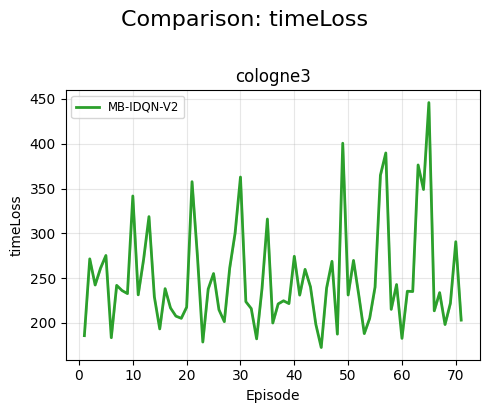


📊 === 对比指标: rewards ===


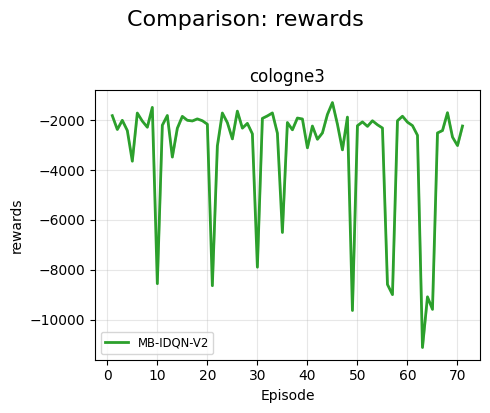


📊 === 对比指标: queue_lengths ===


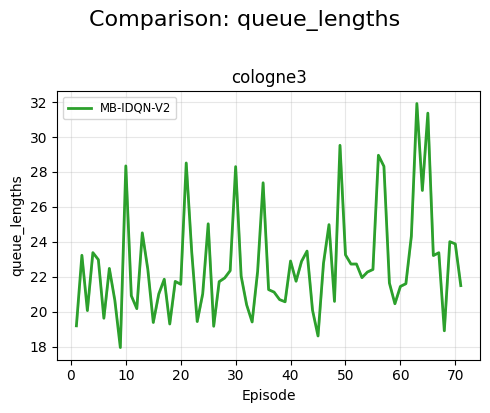

In [18]:
%matplotlib inline
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import glob
from collections import defaultdict

# ==============================
# 👇👇👇 修改这里来进行对比 👇👇👇
# ==============================

# 把你想对比的算法都在 ALGS_MAPPING 中定义
# Key: 用于在文件名中进行匹配的关键词 (区分大小写，但匹配时会转小写)
# Value: 在图例上显示的友好名称
ALGS_MAPPING = {
    # "IDQN": "IDQN (Baseline)",
    # 从您的文件名中提取的核心部分
    "mbidqn": "MB-IDQN-V2", 
    # 如果您还需要 IPPO, 可以添加:
    # "IPPO": "IPPO"
}

# 把你想对比的算法都写在这里 (使用 Key 来查找文件)
TARGET_ALGS = list(ALGS_MAPPING.keys())

# 你想看的指标
TARGET_METRICS = ["timeLoss", "rewards", "queue_lengths"]

# 结果文件夹
LOG_DIR = "results"

# ==============================

def plot_comparison():
    # 1. 寻找路径
    real_log_dir = None
    search_paths = [LOG_DIR, "../" + LOG_DIR, os.path.expanduser("~/PHD_PROJECTS/RESCO/" + LOG_DIR)]
    for p in search_paths:
        if os.path.exists(p) and os.path.isdir(p):
            real_log_dir = p
            break
    
    if not real_log_dir:
        print(f"❌ 找不到 {LOG_DIR} 文件夹。")
        return

    print(f"✅ 正在读取 {TARGET_ALGS} 的数据...")
    
    # 2. 加载数据
    # 结构: data[地图名][算法名][指标名] = [数据...]
    data = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))
    json_files = glob.glob(os.path.join(real_log_dir, "*.json"))
    
    for filepath in json_files:
        filename = os.path.basename(filepath)
        if "config.json" in filename: continue
        
        # 检查文件名是否包含我们要找的算法
        found_alg_key = None
        for target_key in TARGET_ALGS:
            if target_key.lower() in filename.lower():
                found_alg_key = target_key # 使用你在 TARGET_ALGS 中定义的 Key
                break
        
        if not found_alg_key: continue

        try:
            # 提取地图名
            if '+' in filename:
                map_name = filename.split('+')[0]
            else:
                map_name = "Unknown"

            with open(filepath, 'r') as f:
                content = json.load(f)
                
            # 使用算法的友好名称作为字典的键
            alg_display_name = ALGS_MAPPING[found_alg_key]

            for metric in TARGET_METRICS:
                if metric in content:
                    for run_hash, values in content[metric].items():
                        if len(values) > 0:
                            # 使用友好名称存储数据
                            data[map_name][alg_display_name][metric].append(values)
        except Exception as e:
            # print(f"Warning: Failed to process {filepath}. Error: {e}")
            continue

    # 3. 画图
    maps = sorted(data.keys())
    if not maps:
        print("没有找到数据，请检查文件名或实验是否完成。")
        return

    # 获取所有在数据中出现过的算法 (即友好的显示名称)
    all_algs_in_data = sorted(list(set(alg for map_data in data.values() for alg in map_data.keys())))

    for metric in TARGET_METRICS:
        print(f"\n📊 === 对比指标: {metric} ===")
        
        n_maps = len(maps)
        # n_cols = 3
        n_cols = 1
        n_rows = (n_maps + n_cols - 1) // n_cols
        
        # 避免 n_maps=0 导致的问题 (虽然前面已经检查过)
        if n_maps == 0: continue
            
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
        
        # 确保 axes 是一个可迭代的列表
        if n_maps == 1: axes = [axes]
        else: axes = axes.flatten()
        
        fig.suptitle(f"Comparison: {metric}", fontsize=16, y=1.02)

        for i, map_name in enumerate(maps):
            ax = axes[i]
            ax.set_title(map_name)
            
            has_data = False
            
            # 遍历所有在数据中出现过的算法 (使用友好名称)
            for alg_name in all_algs_in_data:
                seeds_data = data[map_name][alg_name][metric]
                if not seeds_data: continue
                has_data = True
                
                # 对齐数据
                min_len = min(len(s) for s in seeds_data)
                truncated = [s[:min_len] for s in seeds_data]
                arr = np.array(truncated)
                
                mean = np.mean(arr, axis=0)
                std = np.std(arr, axis=0)
                x = range(1, len(mean) + 1)
                
                # 自动配色：根据友好名称进行配色
                if "IDQN" in alg_name.upper() and "MB" not in alg_name.upper(): color = 'tab:red'
                elif "MB" in alg_name.upper(): color = 'tab:green' # Model-Based 使用绿色
                elif "IPPO" in alg_name.upper(): color = 'tab:blue'
                else: color = None

                ax.plot(x, mean, label=f"{alg_name}", color=color, linewidth=2)
                ax.fill_between(x, mean - std, mean + std, alpha=0.2, color=color)

            if not has_data:
                ax.text(0.5, 0.5, "No Data", ha='center')
            else:
                ax.set_xlabel("Episode")
                ax.set_ylabel(metric)
                ax.grid(True, alpha=0.3)
                ax.legend(fontsize='small')

        # 隐藏多余的子图
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)
            
        plt.tight_layout()
        plt.show()

plot_comparison()